# ACSE-2 Coursework for Wave Propagation, November 2019

This Jupyter notebook contains several tasks which require you to write code, as well as some explanations, into some of the coding cells.  

–Be sure to read the tasks carefully!

It also contains several cells that plot the contents of various arrays for you, as well snapshots and animations of the final results. You can use these to check whether your coding works as you expect.

Note that it's well worth adding comments to your coding, so that, even if the code itself doesn't quite behave as you want, you may still be able to gain some marks by showing your intentions.

## Import libraries

In [16]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from IPython.display import HTML
import sys

----

## Create domain model properties (i.e. speed of waves), and discretisation grid

> ## –––– Task 1 ––––
>
> **– Create a model array named `c` for a domain of size 5km by 4km, with grid-spacing 10m.**
>
> **– Fill it with a wave-propagation speed that is 1.52km/s at the top-left corner, with a gradient such that the propagation speed decreases linearly in the direction heading along the diagonal, and reaching 820m/s at the bottom-right corner.**
>
> (10 marks)

In [54]:
# REPLACE THE QUESTION-MARKS BELOW to fulfil the first part of task 1...

# domain dimensions
length = 5000 #in m
depth = 4000



# grid-spacing
dx = 10 #in m

# now find the number of grid-points along each dimension
nx = int(length/dx+1)
nz = int(depth/dx+1)

# create the array for the domain's model properties
c = np.zeros([nx,nz])


m = (1520-820)/(nx+nz-2)
# WRITE CODE BELOW to fill model properties into array c (second part of task 1)...
for ix in range(nx):
    for iz in range(nz):
        c[ix,iz] = 1520 - m*(iz+ix)        

# let's print some information about the model properties you coded above
print('Domain is %d x %d grid-cells (%.1fm x %.1fm)' % (nx,nz,length,depth))
print('Grid-spacing (dx) is %.3fm' % (dx))
print('Range of speeds is %.2fm/s to %.2fm/s' % (c.min(),c.max()))
print('Speed at top-left is %.2fm/s  Speed at bottom-right is %.2fm/s' % (c[0,0],c[-1,-1]))

Domain is 501 x 401 grid-cells (5000.0m x 4000.0m)
Grid-spacing (dx) is 10.000m
Range of speeds is 820.00m/s to 1520.00m/s
Speed at top-left is 1520.00m/s  Speed at bottom-right is 820.00m/s


In [55]:
def plot_model(c):
    plt.figure(figsize=(10,6))
    plt.imshow(c.T)  # plotting the velocity model (note transposed, to orient plot in way we expect)
    plt.colorbar()
    plt.xlabel('x gridpoints')
    plt.ylabel('z gridpoints')
    plt.title('Velocity model (m/s)')
    plt.show()

def plot_hslice(c,zgrid):
    plt.figure(figsize=(7,6))
    plt.plot(c[:,zgrid])
    plt.ylabel('propagation speed / m/s')
    plt.xlabel('x gridpoints')
    plt.title('Horizontal slice through model at z-gridpoint=%d' % zgrid)
    plt.show()

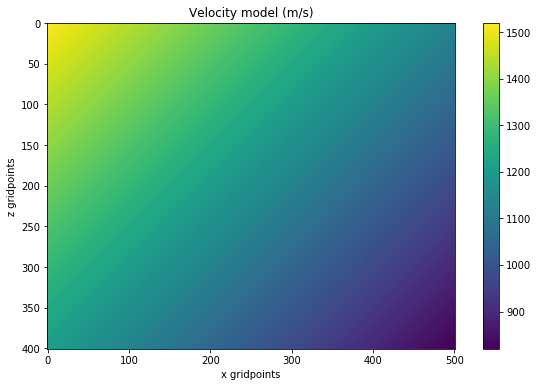

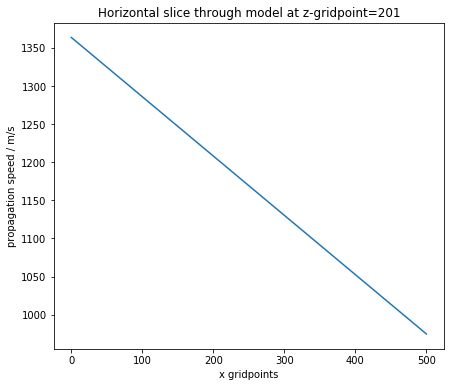

In [56]:
# Now let's plot the model properties across the domain, and a horizontal slice
plot_model(c)
plot_hslice(c,201)

----
## Modelling constraints
#### CFL stability condition should be satisfied – the 'Courant number'.

The dimensionless Courant number, $C$, gives a measure of how far a signal will travel between grid-points within one time-step.

This 'crossing factor' is $c$.$\delta t$/$\delta x$ for speed $c$, and we want the maximum value of this within the whole domain to satisfy some constraint that depends upon the finite-difference stencil(s) in use when modelling.

i.e. we want:$\quad \text{max}(c)$.$\delta t/\delta x <= C_{max}$, where $\ C_{max}$ depends on the discretisations being used.

We can turn this around to find the maximum time-step for our model and grid-spacing, given $C_{max}$ for our discretisations:

$$\delta t_{best} = \frac{C_{max}\ \delta x}{\text{max}(c)}$$

A simple 2nd order spatial stencil, with 2nd-order time-stepping, requires the max crossing factor to (normally) be no more than ~sqrt(1/2)

> ## –––– Task 2 ––––
>
> **– The duration for the simulation should cover at least 3 seconds, with time-steps of 4.7 milliseconds.**
> 
> **– Work out the number of time-steps to cover that time (call it `nt`), and calculate the maximum Courant number within the domain.**
>
> **– Print information about the total simulation time and the maximum Courant number.**
>
> **– Is this time-step size a good choice for this system?** (Explain your answer by filling in comments at the end of the code cell.)
>
> (10 marks)

In [20]:
# REPLACE THE QUESTION-MARKS to fulfil the first part of task 2...

time = 3
dt = 4.7e-3


# WRITE MORE CODE to fulfil the next two parts of task 2...
nt = int(time/dt+0.999)
courant=(c.max())*dt/dx
print('square root of 1/2 is %.5f'% (np.sqrt(0.5)))
print('Time-step = %.5fs  Number of steps = %d  (Total time being modelled: %.5fs)' % (dt,nt,dt*nt))
print('Maximum courant number = %.5f' % (courant))

good_courant = 0.7
good_dt = (good_courant*dx)/c.max()
print('A optimal time step should be %.5fs'%(good_dt))
# WRITE COMMENTS BELOW to explain your answer to the final part of task 2...
# The spatial stencil (simple 2nd order), with 2nd-order time-stepping, requires the max crossing factor to (usually) be no more than sqrt(1/2)
# So, maximum courant number shall be less than sqrt(1/2), approximately 0.707
# The maximum courant number here is 0.7144, which is lager than 0.707, inferin that the time-step size is not a good choice.
# If set courant number as 0.7, the optimal time-step is 0.00461s
#
#
#

square root of 1/2 is 0.70711
Time-step = 0.00470s  Number of steps = 639  (Total time being modelled: 3.00330s)
Maximum courant number = 0.71440
A optimal time step should be 0.00461s


----

### Create source function (ramp up to 10Hz mono-frequency wave)

> ## –––– Task 3 ––––
>
> **– Create variables that will allow you to choose the position of the point source during the time-stepping propagation loop (that is coded further down); place it half-way across the domain, and with depth 750m from the top of the domain**
>
> **– Code a loop in the `create_source` function that creates & fills in an array to contain a sine wave with frequency `freq`, but ramping up the sine wave amplitude from zero to `maxampl` (linearly) over the first 100 steps.**
>
> **– Return that array so the subsequent code cell that calls `create_source` gets its `src` array containing the source you built above.**  
>
> (6 marks)

In [21]:
# CREATE THE VARIABLES for the first part of task 3...
sx = int(length/2/dx)
sz = int(750/dx)

# function to create a source that ramps up to mono-frequency sine wave
# (frequency is 'freq', time-step length is 'dt', number of steps is 'ns')
# WRITE CODE JUST BELOW to create and return the source array to complete the rest of task 3...

def create_source(freq,dt,ns,maxampl):
    src = np.zeros(ns)
    A = np.concatenate((np.linspace(0,maxampl,100), np.ones(ns-100)*maxampl))
    t = np.arange(0,ns)*dt
    
    src = A*np.sin(2*np.pi*freq*t)

    return src

In [22]:
ns = nt  # this source keeps going to the end of time
# call to function below should create a ramped 10Hz sine wave with unit amplitude and 'ns' time steps
src = create_source(10.0,dt,ns,1.0)

In [23]:
def plot_source(src):
    plt.figure(figsize=(10,6))
    plt.plot(src)  # plot source function
    plt.xlabel('timesteps')
    plt.ylabel('amplitude')
    plt.title('Source Function')
    plt.show()

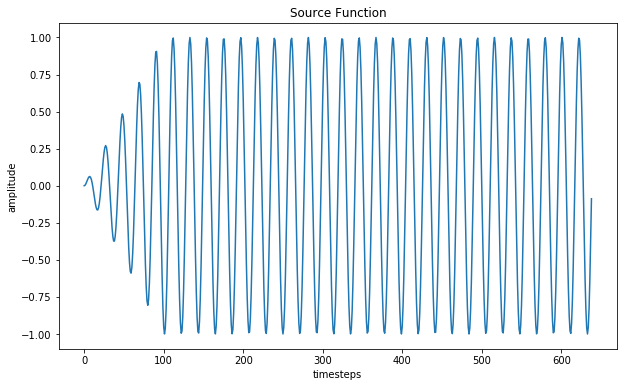

In [24]:
# let's check that your source wavelet looks as you expect by plotting it...
plot_source(src)

### Check that the maximum frequency in the source wavelet can propagate reliably

For a simple second-order finite-difference, the minimum wavelength of a signal that we can propagate reliably over a reasonable distance is about 10 grid-points.

> ## –––– Task 4 ––––
>
> **– Calculate and show the maximum reliable propagation frequency for this model.**
>
> **– Briefly explain, then, what the resulting amplitude spectrum plot tells you.**  
(Write it as a comment where indicated in the code cell further down that calls function `plot_spectrum`.)
>
> (4 marks)

In [25]:
# WRITE CODE BELOW to complete the first part of task 4...
min_cells_per_wl = 10.0  # minimum of 10 cells per wavelength for reasonably accurate propagation
max_freq = c.min()/(min_cells_per_wl*dx) # calculate the max frequency that can be modelled without numerical dispersion
print('Maximum reliable propagation frequency is about %.1fHz' % max_freq)

Maximum reliable propagation frequency is about 8.2Hz


#### Want to avoid causing too much dispersion by keeping maximum significant frequency within this limit...

In [26]:
def plot_spectrum(src,dt,nt,ns):
    plt.figure(figsize=(10,6))
    plt.magnitude_spectrum(np.append(src,np.zeros(nt-ns)), Fs=1/dt)  # note padding to nt points
    plt.title('Amplitude Spectrum')
    plt.xlim(0,35)
    plt.show()

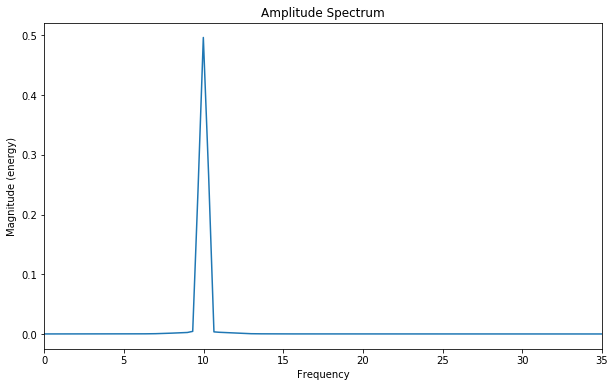

In [27]:
# checking the amplitude spectrum of the source wavelet
plot_spectrum(src,dt,nt,ns)


# GIVE YOUR ANSWER IN COMMENTS BELOW for the final part of task 4:
# The maximum reliable propagation frequency is about 8.2Hz according to the calculation, with dx=10
# The maximum reliable propagation frequency of magnitude_spectrum plot is about 10Hz, which is higher than the calculated result
# Thus, for this given time-step length 'dt' and number of steps 'ns', maximum frequency of around 10 Hz can propagate reliably
# To make the maximum frequency in the source wavelet to propagate reliably, we need to reduce the dx value.
# 
# 
# 

----
## Create model for absorbing boundary layers

> ## –––– Task 5 ––––
>
> **– Write code to fill in array `a` so that it has a layer of width 70 grid-points all the way around the domain so that it has a quadratic increase towards value one, which it should reach once it hits the edges of the domain.**
>
> (10 marks)

In [28]:
a = np.zeros((nx,nz))  # initialise absorbing layer array with zeros

# WRITE CODE BELOW TO FILL ARRAY 'a' ready for quadratic-increase absorbing layer (to fulfil task 5)...

abswid = 70  # 70 grid-points absorbing layer
absw2 = abswid*abswid  # useful shorthand

# left and right absorbing layers
for i in range(1,abswid+1):  # seventy grid-points in layers
    a[abswid-i,:]   = 1.0*i*i/absw2  # quadratic increase towards left boundary
    a[i-abswid-1,:] = 1.0*i*i/absw2  # quadratic increase towards right boundary

# top and bottom absorbing layers
for i in range(1,abswid+1):  # seventy grid-points in layer
    for j in range(nx):
        a[j,abswid-i]   = max(a[j,abswid-i],   1.0*i*i/absw2)  # quadratic increase towards top boundary
        a[j,i-abswid-1] = max(a[j,i-abswid-1], 1.0*i*i/absw2)  # quadratic increase towards bottom boundary


#### Show the absorption model

In [29]:
# various plotting functions that get called below so you can check your absorption model...

def plot_absorbing(a):
    plt.figure(figsize=(10,6))
    plt.title('Absorption')

    plt.imshow(a.T) # plotting the absorption as a 2d colour plot (note transposed, to orient plot in way we expect)
    plt.colorbar()
    plt.xlabel('x gridpoints')
    plt.ylabel('z gridpoints')

    plt.show()


def plot_absorb_horiz(a,zgrid):
    plt.figure(figsize=(8,4))
    plt.title('Horizontal x-section at z-gridpoint=%d' % zgrid)

    plt.plot(a[:,zgrid])  # horizontal cross-section through absorption, to show const/linear/quadratic nature
    plt.xlabel('x gridpoints')
    plt.ylabel('absorption coefficient')

    plt.show()


def plot_absorb_vert(a,xgrid):
    plt.figure(figsize=(8,4))
    plt.title('Vertical x-section at x-gridpoint=%d' % xgrid)

    plt.plot(a[xgrid,:])  # vertical cross-section through absorption, to show const/linear/quadratic nature
    plt.xlabel('z gridpoints')
    plt.ylabel('absorption coefficient')

    plt.show()

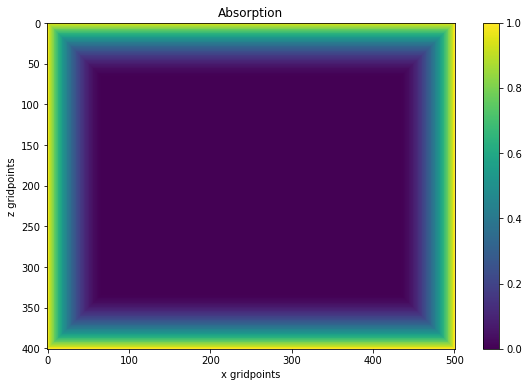

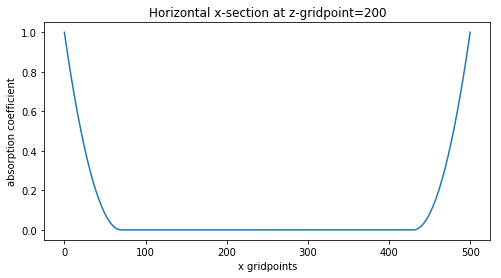

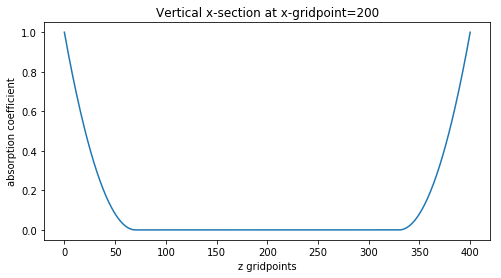

In [30]:
plot_absorbing(a)
plot_absorb_horiz(a,200)
plot_absorb_vert(a,200)

In [31]:
# scales the absorbing factors in array a by the appropriate amounts at each point in space...

#absfact = 0.0  # to switch off absorbing layer
#absfact = 0.1  # without predictive boundary
absfact = 0.05  # with predictive boundary

a[:,:] = a[:,:]*c[:,:]*(dt/dx)*absfact

## Predictive boundary condition

In [32]:
# set up crossing-factor arrays for use at edges with 'predictive' boundary condition
C_zmin = c[:,0]*dt/dx   # along top edge
C_zmax = c[:,-1]*dt/dx  # along bottom edge
C_xmin = c[0,:]*dt/dx   # along left edge
C_xmax = c[-1,:]*dt/dx  # along right edge


# for use with absorbing layers:
predfact_zmin = 0.98
predfact_zmax = 0.98
predfact_xmin = 0.98
predfact_xmax = 0.98

# some extra things that might be useful during task 8...
C_zmid = c[:,149]*dt/dx
predfact_zmid = 1.0


----
## Final preparations – line of detectors & time-stepping arrays

> ## –––– Task 6 ––––
>
> **– Create an array that can be used to simulate a line of detectors that goes all the way across the domain, that will be for recording the wavefield over time that crosses each grid-point in that line.**
>
> **– Create a variable that allows choice for the depth for this line of detectors during the `propagate` function (which is in a code cell later down the notebook), giving it a depth that corresponds to 3km from the top of the domain.**
>
> **– Complete code to create the three arrays to be used for time-stepping during the `propagate` function.**
>
> **– Add comments giving brief explanation what each array will be used for during the simulation.**
>
> (5 marks)

In [33]:
# WRITE CODE BELOW FOR A LINE OF DETECTORS (for first two parts of task 6)...
r=np.zeros((nx,nt))

rz=int(3000/dx)


# REPLACE QUESTION-MARKS BELOW TO CREATE THREE ARRAYS HERE for rest of task 6
# ALSO complete a brief comment for each explaining what it is for...

u_cur = np.zeros((nx,nz))   # this is the recording for the propagate situation under current time point

u_prv = np.zeros((nx,nz))   # this is the recording for the propagate situation 1 time step before

u_nxt = np.zeros((nx,nz))   # this is the recording for the propagate situation 1 time step after


In [34]:
# prepares an array to store wavefield snapshots for plotting later
snapshot_gap = 12 # set sampling rate used to store wavefield (every 12 timesteps)
wavefield = np.zeros((int(nt/snapshot_gap), nx, nz)) # array to store wavefields every 12 timesteps
print('Storing %d wavefields (every %dth out of %d)' % (wavefield.shape[0],snapshot_gap,nt))

Storing 53 wavefields (every 12th out of 639)


----
# Simulation

> ## –––– Task 7 ––––
>
> **– Fill in the code for the `propagate` function below, using the three arrays you created earlier, so that it propagates the wavefield from the source through the domain during the time loop.**
>
> **– In this coding, during the calculation of the new wavefield for a time-step, include the implementation of absorbing layers, using array `a` (which you populated in task 5).**
>
> **– Also include the coding for the predictive boundaries, using the factors in arrays `C_xmin`, `C_xmax`, `C_zmin` & `C_zmax` (see the relevant coding cell earlier in this notebook).**
>
> **– Also include code to fill in the wavefield values along the line of receivers that you set up in task 6.**  
>
> (22 marks)

> ## –––– Task 8 ––––
>
> **– Think of a way to simulate an 'obstruction' across the whole width of the domain at depth 1.5km, such that the wavefield cannot cross it, meaning the wavefield is constrained within the top ~1.5km of the domain. Add code into the time-stepping loop to implement that.**  
(Note that it's ok for the wavefield to 'bounce' off this obstruction -you don't need to try to add an absorbing layer to make the wavefield fade away before it reaches the obstruction.)
>
> **– But leave two 'holes' in this obstruction so that the wave can pass through them. Make the holes each have width 7 grid-points, and position the two holes so they are either side of a vertical line down the middle of the domain, and such that there are 71 grid-points between the holes (i.e. so there is still 'obstruction' for 71 grid-points along the line between the two holes).**
>
> **– After checking above all works as you would expect, include more code to implement a predictive boundary layer just above the obstruction, in order to reduce the reflection of the wavefield that 'bounces' off the obstruction.**  
(You can make use of `C_zmid` and `predfact_zmid` that were defined in the relevant coding cell earlier in this notebook.)
>
> (18 marks)

In [35]:
obstr = int(1500/dx)
ept = int((length/dx-70-2*7)/2)

c[0:ept,obstr]=0
c[ept+7:ept+7+71,obstr]=0
c[-ept:,obstr]=0

In [36]:
# a useful variable – shorthand for something that appears in expressions below
dtdx2 = (dt*dt)/(dx*dx)


def propagate():
    
    u_cur[:] = 0.0
    u_prv[:] = 0.0

    
    u_cur[sx,sz] = src[0] 


    for i in range(nt):

        
        u_nxt[1:-1,1:-1] = ( (2-a[1:-1,1:-1]**2)*u_cur[1:-1,1:-1] - u_prv[1:-1,1:-1]*(1-a[1:-1,1:-1]) \
                           + (c[1:-1,1:-1]**2) * dtdx2 * \
                                (-4*u_cur[1:-1,1:-1]+u_cur[:-2,1:-1]+u_cur[2:,1:-1]+u_cur[1:-1,:-2]+u_cur[1:-1,2:]) ) \
                         / (1+a[1:-1,1:-1])
        
        #8 (c): predictive boundary layer
        u_nxt[:ept,149] = (u_cur[:ept,149]*(1.0-C_zmid[:ept]) + u_cur[:ept,149]*C_zmid[:ept])*predfact_zmid
        u_nxt[ept+7:ept+7+71,149] = (u_cur[ept+7:ept+7+71,149]*(1.0-C_zmid[ept+7:ept+7+71]) + u_cur[ept+7:ept+7+71,149]*C_zmid[ept+7:ept+7+71])*predfact_zmid
        u_nxt[-ept:,149] = (u_cur[-ept:,149]*(1.0-C_zmid[-ept:]) + u_cur[-ept:,149]*C_zmid[-ept:])*predfact_zmid
        
        
        # find u_new for top and bottom edges
        u_nxt[:,0] = (u_cur[:,0]*(1.0-C_zmin[:]) + u_cur[:,1]*C_zmin[:])*predfact_zmin
        u_nxt[:,-1] = (u_cur[:,-1]*(1.0-C_zmax[:]) + u_cur[:,-2]*C_zmax[:])*predfact_zmax

        # find u_new for left and right edges
        u_nxt[0,:] = (u_cur[0,:]*(1.0-C_xmin[:]) + u_cur[1,:]*C_xmin[:])*predfact_xmin
        u_nxt[-1,:] = (u_cur[-1,:]*(1.0-C_xmax[:]) + u_cur[-2,:]*C_xmax[:])*predfact_xmax

        if i+1<ns:
            u_nxt[sx,sz] = src[i+1]
    
        # shift wavefields for next time-step
        u_prv[:,:] = u_cur[:,:]
        u_cur[:,:] = u_nxt[:,:]
    
        # fill in values at receivers
        r[:,i] = u_cur[:,rz]

        if (i+1)%snapshot_gap == 0: # store the current wavefield u on every tenth step
            wavefield[int((i+1)/snapshot_gap-1)] = u_cur[:,:]

    print('Finished %d time-steps' % (nt))

In [37]:
propagate()

Finished 639 time-steps


## Plot wavefield at different times

In [38]:
def plot_snapshot(plot_time,bounds):
    plt.figure(figsize=(10,7))
    plt.imshow(wavefield[int(plot_time/(dt*snapshot_gap))].T,   # note the wavefield was transposed
               vmin=-bounds, vmax=bounds, cmap='RdBu', interpolation='bilinear')
    plt.title('Wavefield at about %.2fs' % (plot_time))
    plt.colorbar()
    plt.xlabel('x gridpoints')
    plt.ylabel('z gridpoints')
    plt.show()

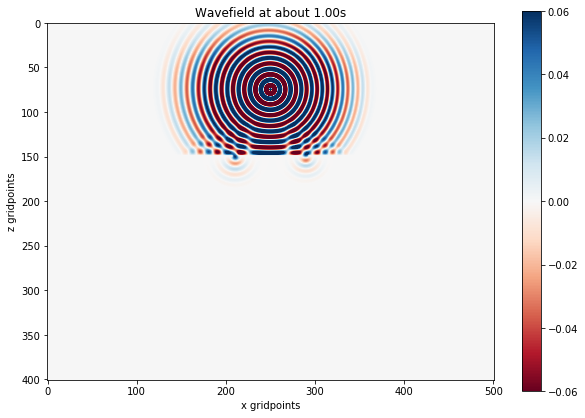

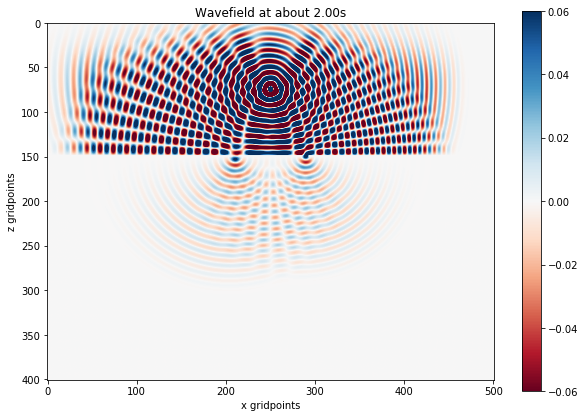

In [39]:
plot_snapshot(1.0,0.06)
plot_snapshot(2.0,0.06)

## Plot data at receivers

In [40]:
def plot_at_receivers(r,bounds):
    plt.figure(figsize=(10,7))
    plt.imshow(r.T, cmap='RdBu', interpolation='bilinear', aspect='auto', 
               vmin=-bounds, vmax=bounds,   # set bounds for colourmap data
               extent=(0,nx,time,0))  # set bounds for axes
    plt.title('Receiver Data')
    plt.colorbar()
    plt.xlabel('Receiver number')
    plt.ylabel('Time / s')
    plt.show()

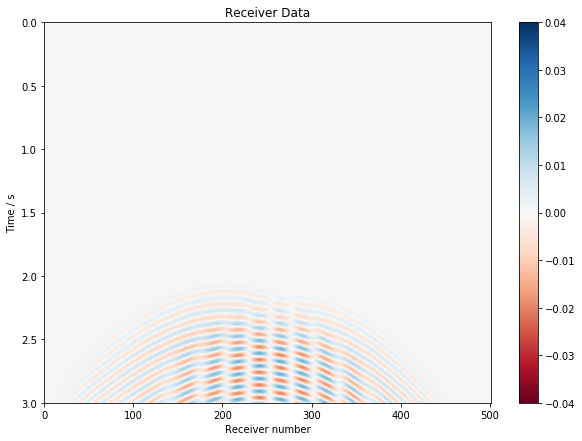

In [41]:
plot_at_receivers(r,0.04)

In [42]:
def plot_rms(data):
    plt.figure(figsize=(10,6))
    plt.plot(data)
    plt.xlabel('receiver number')
    plt.ylabel('amplitude')
    plt.title('RMS at receivers')
    plt.show()

> ## –––– Task 9 ––––
>
> **– Write code to calculate the RMS (root-mean-squared) value over time at each receiver grid-point and put it into an array.**
>
>**– Call the `plot_rms` function to plot the RMS values.**
>
> **The RMS value for a receiver corresponds to the overall intensity of the wavefield arriving at that receiver.  
> – Describe the pattern you see shown in the plot below.  
> – Does it remind you of a well-known optics experiment/demonstration?  
> – But what do you think is slightly different about the intensity plot shown here, and why?**
>
> (15 marks)

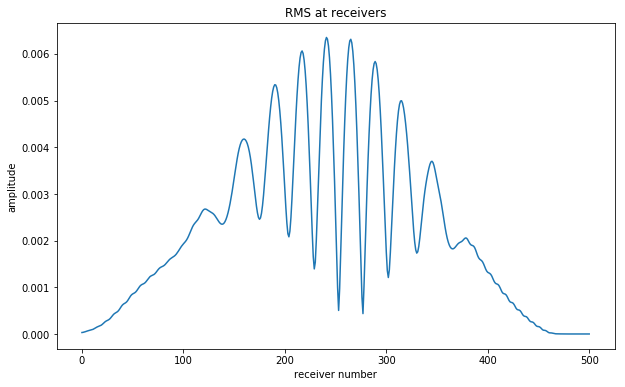

In [51]:
# WRITE CODE BELOW to find RMS at receivers for the first two parts of task 9...
data=np.zeros(nx)
for i in range(nx):
    data[i]=np.sqrt(np.mean(r[i,:]**2))
plot_rms(data)


# WRITE COMMENTS BELOW to answer the final part of task 9...
# 
# 1):
# The plot pattern has several peaks and off-peaks. The middle wave has the largest amplitude, and also the largest low-tide lies beside the highest peak.
# The amplitude of the peaks become smaller along with the increment of distance to the middle point.

# 2):
# This pattern is kind of similar to the Young's double slit interference experiment, 
# dispite the variations caused by the differentiation of propagation speed;
# In the Young's double slit interference experiment, light shows the property of "wave": propagates with the same pattern as an actural wave.

# 3):
# (a) The plot we've got is not symmetric, comparing to the Young's double slit interference experiment.
# The reason is that the wave-propagation speed field, c, in our case, is not a constant. The velocity field varies from place to place
# But Young's double slit interference experiment used light as a wave, which has identical velocity.
# As a result, Young's double slit interference experiment shows a symmetric pattern and ours not.
#
# (2) the lowest value between peak points does not reach 0.
# The Double-slit experiment, the amplitude between the peaks can reach down to 0, which is different from this case.
#

<img src="Double_slit_diffraction.PNG" alt="Drawing" style="width: 600px;"/>

<img src="young's.jpg" alt="Drawing" style="width: 600px;"/>

## Make a movie! 

(Partly for fun – but also so that, as you develop the code during tasks 7, 8 & 9 above, you can visualise what is happening to the wavefield across time, which should help you to check that your code is behaving as you would expect...)

In [44]:
def create_animation(bounds):
    fig = plt.figure(figsize=(10,8))

    plt.title('Wavefield')
    plt.xlabel('x gridpoints')
    plt.ylabel('z gridpoints')

    n = wavefield.shape[0]
    imgs = []
    for i in range(n):
        if i%20==0:  # show progress every 20 frames
            sys.stdout.write('Done %d of %d\r' % (i+1,n))
        img = plt.imshow(wavefield[i].T, vmin=-bounds, vmax=bounds, cmap='RdBu',
                         animated=True, interpolation='bilinear')
        imgs.append([img])

    print('Finished plots for frames, building animation...')

    ani = anim.ArtistAnimation(fig, imgs, interval=50, blit=True)

    plt.close(fig)  # prevent final frame plot from showing up inline below

    return ani

In [45]:
ani = create_animation(0.05)
print('Preparing HTML (takes a little while...)')
HTML(ani.to_jshtml())

Finished plots for frames, building animation...
Preparing HTML (takes a little while...)
